In [0]:
#impports
import urllib 
from pyspark.sql.functions import col

#File Download
dbutils.fs.mkdirs('dbfs:/downloads/data')
urllib.request.urlretrieve('https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2023-05.parquet', '/tmp/yellow_data.parquet')

# Simulate Layers
dbutils.fs.mkdirs('dbfs:/nyc_taxi/raw')
dbutils.fs.mkdirs('dbfs:/nyc_taxi/processed')

# Move to location
dbutils.fs.mv("file:/tmp/yellow_data.parquet", "dbfs:/nyc_taxi/raw/yellow_data.parquet")


Out[2]: True

In [0]:
# Validation of raw existance
display(dbutils.fs.ls('dbfs:/nyc_taxi/raw/'))

path,name,size,modificationTime
dbfs:/nyc_taxi/raw/yellow_data.parquet,yellow_data.parquet,58654627,1721227971000


In [0]:
# Read teh data from the raw folder 
df = spark.read.parquet('dbfs:/nyc_taxi/raw/')
display(df)

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee
1,2023-05-01T00:33:13.000+0000,2023-05-01T00:53:01.000+0000,0,7.8,1,N,138,43,1,33.8,7.75,0.5,8.6,0.0,1.0,51.65,0.0,1.75
1,2023-05-01T00:42:49.000+0000,2023-05-01T01:11:18.000+0000,2,8.1,1,N,138,262,1,35.9,10.25,0.5,9.5,0.0,1.0,57.15,2.5,1.75
1,2023-05-01T00:56:34.000+0000,2023-05-01T01:13:39.000+0000,2,9.1,1,N,138,141,1,35.2,10.25,0.5,10.7,6.55,1.0,64.2,2.5,1.75
2,2023-05-01T00:00:52.000+0000,2023-05-01T00:20:12.000+0000,1,8.21,1,N,138,140,1,33.1,6.0,0.5,2.24,0.0,1.0,47.09,2.5,1.75
1,2023-05-01T00:05:50.000+0000,2023-05-01T00:19:41.000+0000,0,7.9,1,N,138,263,1,31.0,10.25,0.5,9.85,6.55,1.0,59.15,2.5,1.75
1,2023-05-01T00:42:54.000+0000,2023-05-01T01:04:49.000+0000,0,10.4,1,N,138,246,1,42.2,10.25,0.5,8.5,6.55,1.0,69.0,2.5,1.75
2,2023-05-01T00:50:34.000+0000,2023-05-01T01:12:09.000+0000,1,9.05,1,N,138,116,1,38.0,6.0,0.5,10.76,6.55,1.0,64.56,0.0,1.75
1,2023-05-01T00:13:58.000+0000,2023-05-01T00:18:10.000+0000,1,0.7,1,N,161,48,1,6.5,3.5,0.5,2.85,0.0,1.0,14.35,2.5,0.0
2,2023-04-30T23:48:31.000+0000,2023-04-30T23:57:35.000+0000,1,2.38,1,N,249,231,2,12.1,1.0,0.5,0.0,0.0,1.0,17.1,2.5,0.0
2,2023-05-01T00:28:47.000+0000,2023-05-01T00:39:33.000+0000,1,2.92,1,N,114,230,2,14.9,1.0,0.5,0.0,0.0,1.0,19.9,2.5,0.0


In [0]:
#count 
df.count()

Out[5]: 3513649

In [0]:
# subset 
list_subset = ['passenger_count', 'trip_distance', 'total_amount']

processed_df = df.where(
    (df.passenger_count > 0) &
    (df.total_amount > 10) &
    (df.trip_distance > 1)
)

display(processed_df)

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee
1,2023-05-01T00:42:49.000+0000,2023-05-01T01:11:18.000+0000,2,8.1,1,N,138,262,1,35.9,10.25,0.5,9.5,0.0,1.0,57.15,2.5,1.75
1,2023-05-01T00:56:34.000+0000,2023-05-01T01:13:39.000+0000,2,9.1,1,N,138,141,1,35.2,10.25,0.5,10.7,6.55,1.0,64.2,2.5,1.75
2,2023-05-01T00:00:52.000+0000,2023-05-01T00:20:12.000+0000,1,8.21,1,N,138,140,1,33.1,6.0,0.5,2.24,0.0,1.0,47.09,2.5,1.75
2,2023-05-01T00:50:34.000+0000,2023-05-01T01:12:09.000+0000,1,9.05,1,N,138,116,1,38.0,6.0,0.5,10.76,6.55,1.0,64.56,0.0,1.75
2,2023-04-30T23:48:31.000+0000,2023-04-30T23:57:35.000+0000,1,2.38,1,N,249,231,2,12.1,1.0,0.5,0.0,0.0,1.0,17.1,2.5,0.0
2,2023-05-01T00:28:47.000+0000,2023-05-01T00:39:33.000+0000,1,2.92,1,N,114,230,2,14.9,1.0,0.5,0.0,0.0,1.0,19.9,2.5,0.0
2,2023-05-01T00:18:49.000+0000,2023-05-01T00:43:41.000+0000,1,14.29,1,N,138,13,1,54.1,6.0,0.5,12.82,0.0,1.0,78.67,2.5,1.75
1,2023-05-01T00:52:48.000+0000,2023-05-01T01:17:35.000+0000,1,11.3,1,N,132,129,1,45.0,1.0,0.5,6.0,0.0,1.0,53.5,0.0,0.0
2,2023-05-01T00:55:22.000+0000,2023-05-01T00:58:20.000+0000,1,1.19,1,N,230,100,1,7.2,1.0,0.5,2.44,0.0,1.0,14.64,2.5,0.0
2,2023-05-01T00:28:12.000+0000,2023-05-01T00:36:09.000+0000,1,2.3,1,N,170,140,1,12.1,1.0,0.5,2.0,0.0,1.0,19.1,2.5,0.0


In [0]:
#count of subset 
processed_df.count()

Out[7]: 2572725

In [0]:
# Write data to folder
processed_df.write.mode("overwrite").parquet('dbfs:/nyc_taxi/processed')

Converting the processed data into tables so that we can apply SQL queries to it.

Fro that we are using CreateView function

In [0]:
processed_df.createOrReplaceTempView("trip_data")

In [0]:
%sql
SELECT * FROM trip_data

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee
1,2023-05-01T00:42:49.000+0000,2023-05-01T01:11:18.000+0000,2,8.1,1,N,138,262,1,35.9,10.25,0.5,9.5,0.0,1.0,57.15,2.5,1.75
1,2023-05-01T00:56:34.000+0000,2023-05-01T01:13:39.000+0000,2,9.1,1,N,138,141,1,35.2,10.25,0.5,10.7,6.55,1.0,64.2,2.5,1.75
2,2023-05-01T00:00:52.000+0000,2023-05-01T00:20:12.000+0000,1,8.21,1,N,138,140,1,33.1,6.0,0.5,2.24,0.0,1.0,47.09,2.5,1.75
2,2023-05-01T00:50:34.000+0000,2023-05-01T01:12:09.000+0000,1,9.05,1,N,138,116,1,38.0,6.0,0.5,10.76,6.55,1.0,64.56,0.0,1.75
2,2023-04-30T23:48:31.000+0000,2023-04-30T23:57:35.000+0000,1,2.38,1,N,249,231,2,12.1,1.0,0.5,0.0,0.0,1.0,17.1,2.5,0.0
2,2023-05-01T00:28:47.000+0000,2023-05-01T00:39:33.000+0000,1,2.92,1,N,114,230,2,14.9,1.0,0.5,0.0,0.0,1.0,19.9,2.5,0.0
2,2023-05-01T00:18:49.000+0000,2023-05-01T00:43:41.000+0000,1,14.29,1,N,138,13,1,54.1,6.0,0.5,12.82,0.0,1.0,78.67,2.5,1.75
1,2023-05-01T00:52:48.000+0000,2023-05-01T01:17:35.000+0000,1,11.3,1,N,132,129,1,45.0,1.0,0.5,6.0,0.0,1.0,53.5,0.0,0.0
2,2023-05-01T00:55:22.000+0000,2023-05-01T00:58:20.000+0000,1,1.19,1,N,230,100,1,7.2,1.0,0.5,2.44,0.0,1.0,14.64,2.5,0.0
2,2023-05-01T00:28:12.000+0000,2023-05-01T00:36:09.000+0000,1,2.3,1,N,170,140,1,12.1,1.0,0.5,2.0,0.0,1.0,19.1,2.5,0.0


count_vendor,VendorID
628904,1
1943821,2


Out[11]: <AxesSubplot:ylabel='VendorID'>

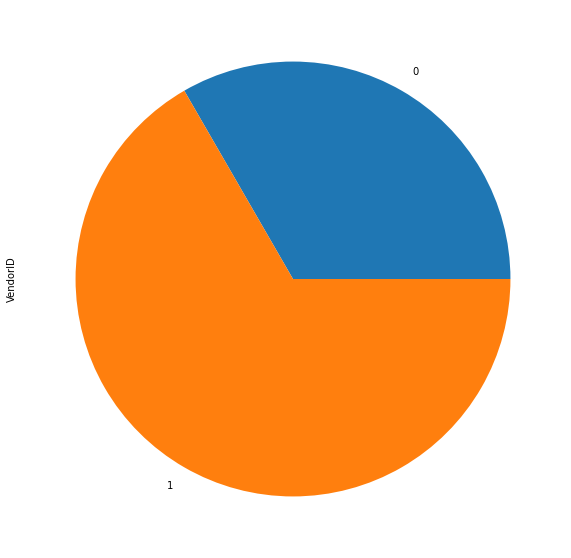

In [0]:
# Create some visualization (Pandas/Matplotlib) [Vendor ID]
df_viz1 = spark.sql("SELECT COUNT(VendorID) as count_vendor, VendorID FROM trip_data GROUP BY VendorID").toPandas()
display(df_viz1)
df_viz1.plot.pie(y='VendorID',legend=False, figsize=(10, 10))